In [1]:
%load_ext autoreload
%matplotlib widget
%autoreload 2
from amftrack.pipeline.launching.run_super import (
    run_launcher,
    directory_scratch,
    directory_project,
    directory_project,
    run_parallel_stitch,
    run_parallel_transfer,
)
import os
from amftrack.util.sys import (
    get_dates_datetime,
    get_dirname,
    temp_path,
    get_data_info,
    update_plate_info,
    update_analysis_info,
    get_analysis_info,
    get_current_folders,
    get_folders_by_plate_id,
)
from time import time_ns
from amftrack.util.dbx import upload_folders, load_dbx, download, get_dropbox_folders
from datetime import datetime
from amftrack.pipeline.functions.image_processing.experiment_util import (
    plot_full_image_with_features,
)
from amftrack.pipeline.functions.image_processing.experiment_class_surf import (
    load_graphs,
)
from amftrack.pipeline.functions.post_processing.extract_study_zone import (
    load_study_zone,
)
from amftrack.pipeline.functions.image_processing.experiment_util import (
    get_random_edge,
    distance_point_edge,
    plot_edge,
    plot_edge_cropped,
    find_nearest_edge,
    get_edge_from_node_labels,
    plot_full_image_with_features,
    get_all_edges,
    get_all_nodes,
    find_neighboring_edges,
    reconstruct_image,
    reconstruct_skeletton_from_edges,
    reconstruct_skeletton_unicolor,
    plot_edge_width,
    reconstruct_image_from_general,
    plot_full,
)
from amftrack.pipeline.functions.image_processing.extract_width_fun import (
    get_width_info,
    get_width_info_new,
)
import matplotlib.pyplot as plt
from amftrack.pipeline.functions.image_processing.experiment_class_surf import (
    Experiment,
    save_graphs,
)
import pandas as pd

/gpfs/home2/cbisot/pycode/AMFtrack/amftrack/util/dbx.py:3: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm
2023-02-26 18:41:30.813295: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-02-26 18:41:30.938710: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /gpfs/home2/cbisot/miniconda3/envs/amftrack/lib/python3.7/site-packages/cv2/../../lib64:
2023-02-26 18:41:30.938745: I tensorflow/stream_executor/cuda/cudart_stub.cc:29

In [2]:
plates = [
    "078_20220920",
    "079_20220920",
    "080_20220920",
    "081_20220920",
    "082_20220920",
    "083_20220920",
    "084_20220920",
    "001_20220920",
    "024_20220920",
    "073_20220920",
    "002_20220920",
    "003_20220920",
    "004_20220920",
    "005_20220920",
    "006_20220920",
    "007_20220920",
    "008_20220920",
    "009_20220920",
    "010_20220920",
    "011_20220920",
    "012_20220920",
    "019_20220920",
    "020_20220920",
    "021_20220920",
    "022_20220920",
    "023_20220920",
    "037_20220920",
    "038_20220920",
    "039_20220920",
    "040_20220920",
    "042_20220920",
    "043_20220920",
    "044_20220920",
    "045_20220920",
    "046_20220920",
    "016_20220921",
    "017_20220921",
    "034_20220921",
    "051_20220920",
    "094_20220921",
    "064_20220921",
    "026_20220921",
    "027_20220921",
    "028_20220921",
    "029_20220921",
    "031_20220921",
    "033_20220921",
    "035_20220921",
    "036_20220921",
    "047_20220920",
    "041_20220920",
    "015_20220921",
    "068_20220921",
    "107_20220921",
    "095_20220921",
    "062_20220921",
    "096_20220921",
    "104_20220921",
    "050_20220920",
    "030_20220921",
    "025_20220921",
    "100_20220921",
    "067_20220921",
    "048_20220920",
    "055_20220921",
    "056_20220921",
    "057_20220921",
    "058_20220921",
    "059_20220921",
    "060_20220921",
    "061_20220921",
    "063_20220921",
    "014_20220921",
    "018_20220921",
    "099_20220921",
    "069_20220921",
    "054_20220920",
    "075_20220920",
    "092_20220921",
    "093_20220921",
    "097_20220921",
    "098_20220921",
    "105_20220921",
    "106_20220921",
    "108_20220921",
    "085_20220921",
    "086_20220921",
    "087_20220921",
    "088_20220921",
    "089_20220921",
    "090_20220921",
    "091_20220921",
    "049_20220920",
    "052_20220920",
    "053_20220920",
    "074_20220920",
    "076_20220920",
    "077_20220920",
    "013_20220921",
    "070_20220921",
    "071_20220921",
    "072_20220921",
    "102_20220921",
    "032_20220921",
    "101_20220921",
    "065_20220921",
    "066_20220921",
    "103_20220921",
]
plates = [
    "_".join((str(int(plate.split("_")[0])), str(int(plate.split("_")[1]))))
    for plate in plates
]
directory_targ = directory_project

In [2]:
plates = [
    "1014_20220525",
    "1023_20220502",
    "102_20201226",
    "1042_20220523",
    "1045_20220504",
    "1048_20220506",
    "1053_20220413",
    "1076_20220511",
    "127_20220705",
    "130_20220707",
    "152_20201224",
    "30_20220509",
]
plates = [
    "52_20220707",
]

In [3]:
directory_targ = directory_project

In [4]:
update_analysis_info(directory_targ)
analysis_info = get_analysis_info(directory_targ)
analysis_folders = analysis_info.loc[analysis_info["unique_id"].isin(plates)]

In [5]:
update_plate_info(directory_targ, local=True)
all_folders = get_current_folders(directory_targ, local=True)

analysed:   0%|          | 0/1934 [00:00<?, ?it/s]

In [6]:
plates = ["52_20220707"]
folders = all_folders.loc[all_folders["unique_id"].isin(plates)]
folders = folders.sort_values(by="datetime")

In [8]:
folders

,total_path,Plate,PrincePos,root,strain,medium,split,Pbait,CrossDate,Temperature,...,/Analysis/transform_corrupt.mat,/Analysis/skeleton_realigned_compressed.mat,/Analysis/nx_graph_pruned.p,/Analysis/nx_graph_pruned_width.p,/Analysis/nx_graph_pruned_labeled.p,date,folder,Temp,unique_id,datetime
40,/projects/0/einf914/data/20220707_1458_Plate07,52,7,'Carrot','A5','001P100N100C','Y','-',20220707,25,...,False,True,True,True,True,"07.07.2022, 14:58:",20220707_1458_Plate07,NaN,52_20220707,2022-07-07 14:58:00
204,/projects/0/einf914/data/20220707_1715_Plate07,52,7,'Carrot','A5','001P100N100C','Y','-',20220707,25,...,False,True,True,True,True,"07.07.2022, 17:15:",20220707_1715_Plate07,NaN,52_20220707,2022-07-07 17:15:00
251,/projects/0/einf914/data/20220707_1915_Plate07,52,7,'Carrot','A5','001P100N100C','Y','-',20220707,25,...,False,True,True,True,True,"07.07.2022, 19:15:",20220707_1915_Plate07,NaN,52_20220707,2022-07-07 19:15:00
159,/projects/0/einf914/data/20220707_2115_Plate07,52,7,'Carrot','A5','001P100N100C','Y','-',20220707,25,...,False,True,True,True,True,"07.07.2022, 21:15:",20220707_2115_Plate07,NaN,52_20220707,2022-07-07 21:15:00
16,/projects/0/einf914/data/20220707_2315_Plate07,52,7,'Carrot','A5','001P100N100C','Y','-',20220707,25,...,False,True,True,True,True,"07.07.2022, 23:15:",20220707_2315_Plate07,NaN,52_20220707,2022-07-07 23:15:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
391,/projects/0/einf914/data/20220821_1721_Plate31,52,31,'Carrot','A5','001P100N100C','Y','-',20220707,25,...,False,True,True,True,True,"21.08.2022, 17:21:",20220821_1721_Plate31,NaN,52_20220707,2022-08-21 17:21:00
200,/projects/0/einf914/data/20220822_0120_Plate31,52,31,'Carrot','A5','001P100N100C','Y','-',20220707,25,...,False,True,True,True,True,"22.08.2022, 01:20:",20220822_0120_Plate31,NaN,52_20220707,2022-08-22 01:20:00
167,/projects/0/einf914/data/20220822_0921_Plate31,52,31,'Carrot','A5','001P100N100C','Y','-',20220707,25,...,False,False,False,False,False,"22.08.2022, 09:21:",20220822_0921_Plate31,NaN,52_20220707,2022-08-22 09:21:00
1172,/projects/0/einf914/data/20220822_1721_Plate31,52,31,'Carrot','A5','001P100N100C','Y','-',20220707,25,...,False,True,True,True,True,"22.08.2022, 17:21:",20220822_1721_Plate31,NaN,52_20220707,2022-08-22 17:21:00


In [27]:
analysis_folders = analysis_info.loc[analysis_info["unique_id"].isin(["66_20220921"])]

In [7]:
exp = Experiment(directory_targ)
exp.load(folders[1:200:80])
# exp.load(folders)


exp.dates.sort()

/gpfs/home2/cbisot/pycode/AMFtrack/amftrack/pipeline/functions/image_processing/experiment_class_surf.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.folders["date"], format="%d.%m.%Y, %H:%M:"


2022-07-07 17:15:00
2022-07-15 08:19:00
2022-08-04 08:25:00


In [6]:
get_width_info_new(exp, 2, resolution=50)


True


{(34474, 45538): 5.686792,
 (45538, 45526): 0,
 (45538, 48137): 0,
 (45526, 46788): 0,
 (45526, 41949): 0,
 (48137, 48166): 4.800766,
 (48137, 41949): 0,
 (48037, 41865): 0,
 (48037, 48038): 0,
 (48037, 40586): 4.6203117,
 (40586, 44174): 5.950263,
 (40586, 35480): 0,
 (44174, 36901): 7.7781534,
 (44174, 36957): 4.206079,
 (35480, 35499): 5.014086,
 (35480, 43050): 4.756569,
 (41949, 34414): 4.4798136,
 (41865, 39501): 5.0518107,
 (41865, 48038): 0,
 (46788, 48116): 0,
 (46788, 48117): 0,
 (48038, 41881): 3.8372035,
 (39501, 43126): 0,
 (39501, 43116): 0,
 (48116, 43126): 5.346835,
 (48116, 48117): 0,
 (43126, 43124): 0,
 (48117, 45507): 5.689394,
 (41881, 43091): 0,
 (41881, 41882): 0,
 (43116, 43124): 0,
 (43116, 40663): 0,
 (45507, 43124): 4.5045257,
 (45507, 40677): 0,
 (43124, 40663): 0,
 (40677, 40663): 0,
 (40677, 39517): 0,
 (39492, 43091): 3.6917834,
 (43091, 41882): 5.2798223,
 (40663, 39517): 0,
 (46571, 36901): 5.3547244,
 (36901, 47963): 5.42729,
 (36901, 34305): 5.053315,

In [8]:
for t in range(exp.ts):
    exp.load_tile_information(t)

load_graphs(exp, directory_targ, post_process=True)

In [9]:
from amftrack.pipeline.functions.image_processing.experiment_class_surf import (
    Edge,
    Node,
)
import numpy as np

In [10]:
t = 1
edges = get_all_edges(exp, t)
nodes = get_all_nodes(exp, t)

In [14]:
len(edges)

2744

Text(0, 0.5, 'length weidhted frequencies')

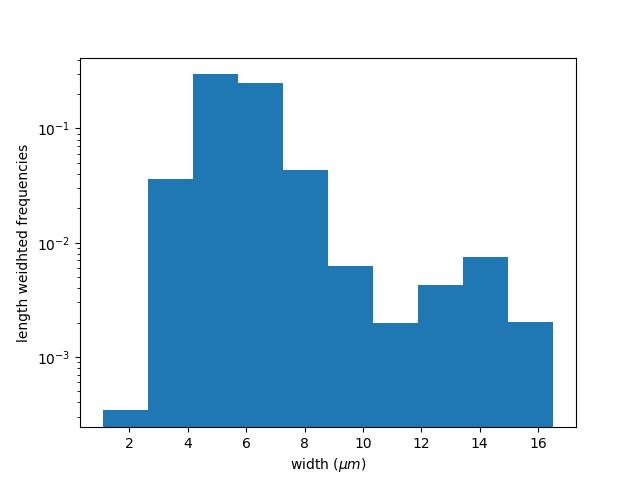

In [19]:
fig, ax = plt.subplots()
widths = [edge.width(t) for edge in edges if edge.width(t)>0]
lengths = [edge.length_um(t) for edge in edges if edge.width(t)>0]
ax.hist(widths,weights =lengths,density=True,log=True)
ax.set_xlabel('width ($\mu m$)')
ax.set_ylabel('length weidhted frequencies')

In [29]:
node_surrounding = [

[Node(50491)]

In [45]:
junctions = [node.edges(t) for node in nodes if node.degree(t)>=1 and node.degree(t)<=3]
degrees = [node.degree(t) for node in nodes if node.degree(t)>=1 and node.degree(t)<=3]
junctions_width = [[edge.width(t) for edge in junction] for junction in junctions]

junctions_length = [[edge.length_um(t) for edge in junction] for junction in junctions]
junctions_min_length = [min(lengths) for lengths in junctions_length]
junctions_min_width = [min(widths) for widths in junctions_width]
junctions_max_width = [max(widths) for widths in junctions_width]
junctions_middle_width = [sorted(widths)[1] if len(widths)>=3 else sorted(widths)[0]  for widths in junctions_width]

In [46]:
junction_data = pd.DataFrame(np.array([junctions_min_width,junctions_middle_width,junctions_max_width,junctions_min_length,degrees]).transpose(),columns=['min_width','middle_width','max_width','min_length','degree'])

In [94]:
junction_data.to_csv('junctions.csv')

In [72]:
junction_data['min_max_ratio'] = junction_data['min_width']/junction_data['max_width']
junction_data['midle_max_ratio'] = junction_data['middle_width']/junction_data['max_width']
junction_data['deviation_murray'] = junction_data['max_width']**n-junction_data['min_width']**n-junction_data['middle_width']**n
select = junction_data.loc[junction_data['min_width']>0]
select = select.loc[select['degree']>1]

In [48]:
n = 3
np.mean(1-select['min_max_ratio']**n-select['midle_max_ratio']**n)

-0.7245938911945409

In [99]:
np.mean(widths)

5.6681232

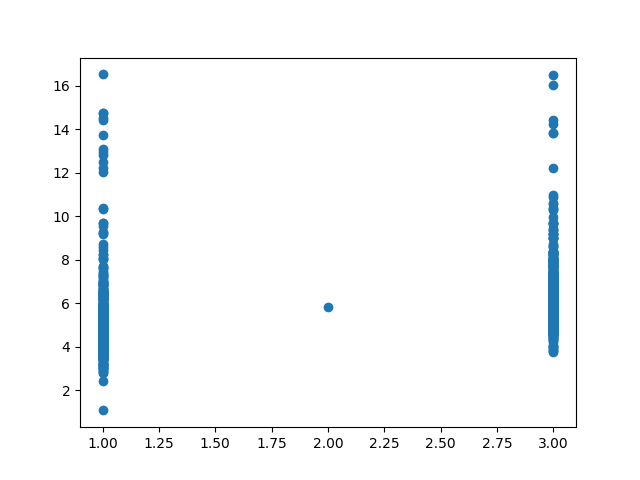

In [49]:
fig, ax = plt.subplots()
ax.scatter(select['degree'],select['max_width'])

(array([0.00095718, 0.0654071 , 0.32639742, 0.19271161, 0.03860613,
        0.00733836, 0.00382871, 0.005424  , 0.00542401, 0.00127624]),
 array([ 1.0788547,  2.6235645,  4.1682744,  5.712984 ,  7.2576942,
         8.802404 , 10.347114 , 11.891824 , 13.436534 , 14.981243 ,
        16.525953 ], dtype=float32),
 <BarContainer object of 10 artists>)

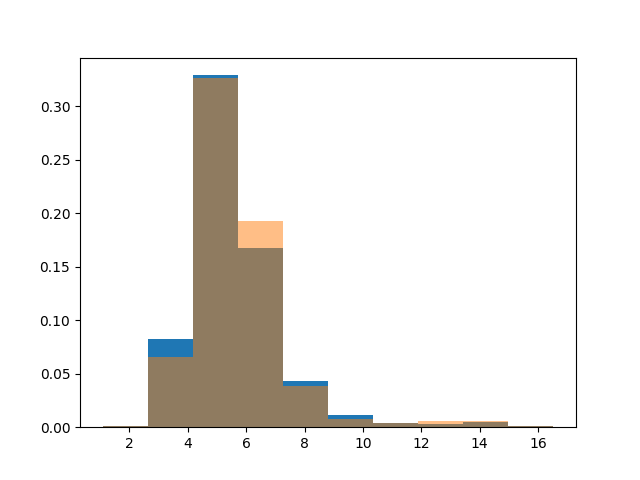

In [50]:
fig, ax = plt.subplots()
select = junction_data.loc[junction_data['min_width']>0]
ax.hist(select['max_width'],density=True)
ax.hist(widths,alpha = 0.5,density=True)


In [132]:
N = 10000
r1 = (np.random.normal(0,0.1,N)+0.56)*10
r2 = (np.random.normal(0,0.1,N)+0.56)*10
maxsr = np.max([r1,r2],axis=0)
minsr = np.min([r1,r2],axis=0)
r3 = np.power(maxsr**3-minsr**3,1/3)
sigma = 0.01
maxsr_noise = maxsr*(1+np.random.normal(0,sigma,N))
minsr_nois = minsr*(1+np.random.normal(0,sigma,N))
r3_noise = middle*(1+np.random.normal(0,sigma,N))
maxsr2 = np.max([maxsr_noise,minsr_nois,r3_noise],axis=0)
minsr2 = np.min([maxsr_noise,minsr_nois,r3_noise],axis=0)
middle2 = np.sort([maxsr_noise,minsr_nois,r3_noise],axis = 0)[1]
deviation = maxsr2**3-middle2**3-minsr2**3


In [128]:
middle[0]

4.110058242109569

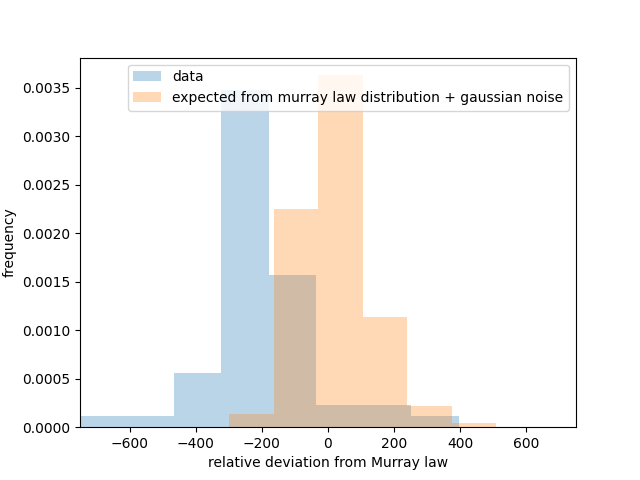

In [133]:
fig, ax = plt.subplots()
select = junction_data.loc[junction_data['min_width']>6]
select = select.loc[select['degree']>1]
hist = ax.hist((select['deviation_murray']),20,density=True,alpha = 0.3,label = "data")
hist2 = ax.hist(deviation,8,density=True,alpha = 0.3,label = "expected from murray law distribution + gaussian noise")

ax.set_xlabel('relative deviation from Murray law')
ax.set_ylabel('frequency')
ax.set_xlim(-750,750)
ax.legend()

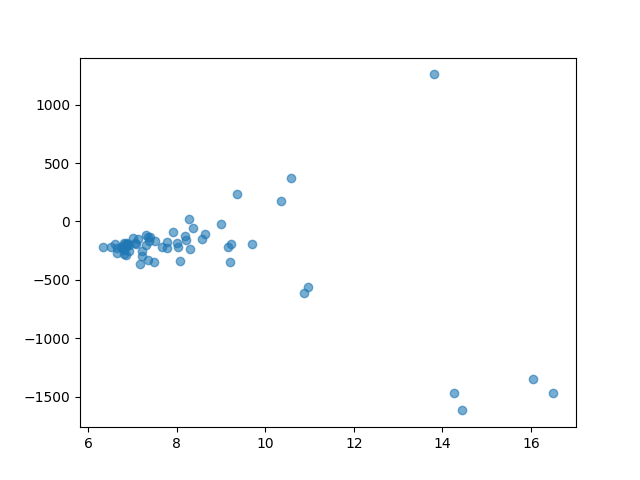

In [89]:
fig, ax = plt.subplots()
ax.scatter(select['max_width'],select['deviation_murray'],alpha = 0.6)

(array([ 1.,  0.,  0.,  0.,  0.,  0.,  2.,  1.,  1.,  1.,  2.,  5.,  7.,
         7.,  7.,  8., 11., 10., 21., 38., 31., 38., 44., 51., 55., 49.,
        53., 54., 35., 14.]),
 array([0.14791379, 0.17617025, 0.20442671, 0.23268318, 0.26093964,
        0.28919611, 0.31745257, 0.34570903, 0.3739655 , 0.40222196,
        0.43047842, 0.45873489, 0.48699135, 0.51524782, 0.54350428,
        0.57176074, 0.60001721, 0.62827367, 0.65653014, 0.6847866 ,
        0.71304306, 0.74129953, 0.76955599, 0.79781246, 0.82606892,
        0.85432538, 0.88258185, 0.91083831, 0.93909478, 0.96735124,
        0.9956077 ]),
 <BarContainer object of 30 artists>)

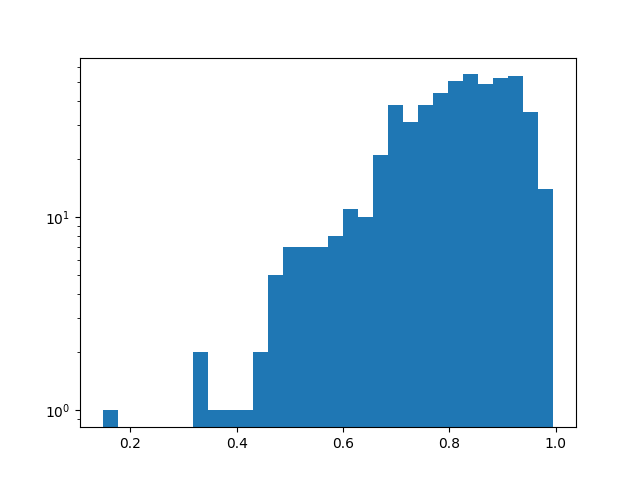

In [81]:
fig, ax = plt.subplots()
ax.hist(select['min_width']/select['max_width'],30,log=True)

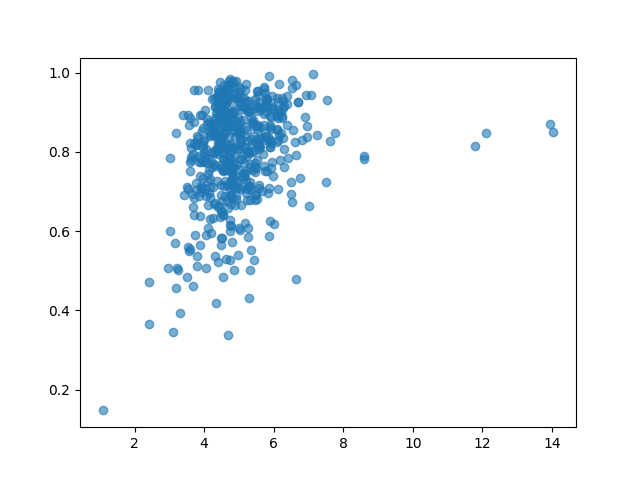

In [77]:
fig, ax = plt.subplots()

ax.scatter(select['min_width'],select['min_width']/select['max_width'],alpha = 0.6)

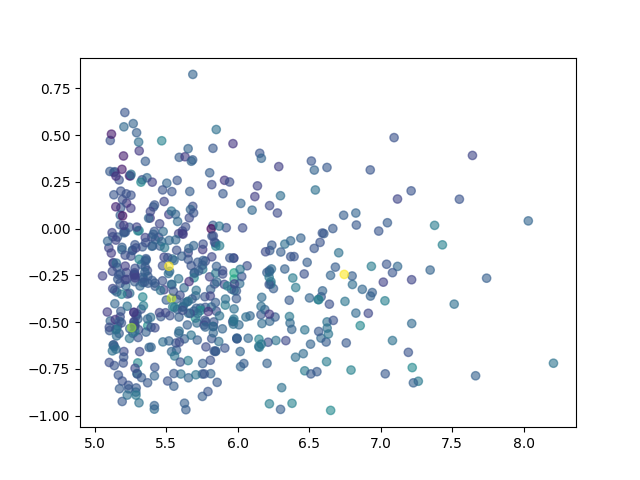

In [92]:
fig, ax = plt.subplots()
ax.scatter(np.log(select['min_length']),1-select['min_max_ratio']**n-select['midle_max_ratio']**n,c=select['min_width'],alpha = 0.6)

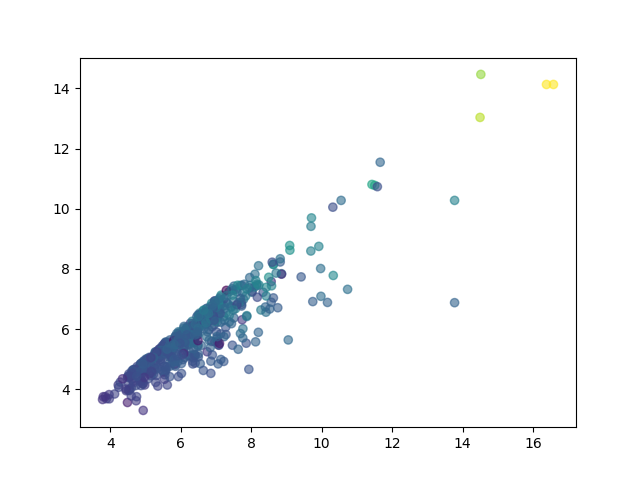

In [83]:
fig, ax = plt.subplots()
ax.scatter(select['max_width'],select['middle_width'],c= select['min_width'],alpha = 0.6)

(array([ 1.,  0.,  0.,  3.,  1.,  5.,  1.,  7., 13., 10., 13., 30., 51.,
        44., 64., 77., 79., 68., 53., 25.]),
 array([0.15237584, 0.19444278, 0.23650971, 0.27857665, 0.32064358,
        0.36271052, 0.40477745, 0.44684438, 0.48891132, 0.53097825,
        0.57304519, 0.61511212, 0.65717905, 0.69924599, 0.74131292,
        0.78337986, 0.82544679, 0.86751373, 0.90958066, 0.95164759,
        0.99371453]),
 <BarContainer object of 20 artists>)

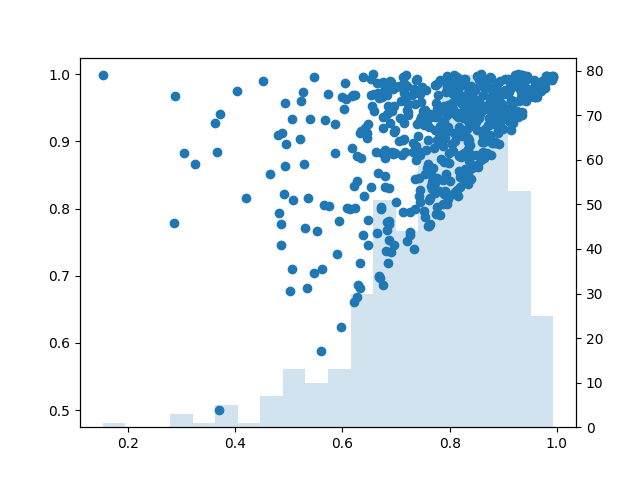

In [57]:
fig, ax = plt.subplots()
ax.scatter(select['min_max_ratio'],select['midle_max_ratio'])
ax2= ax.twinx()
ax2.hist(select['min_max_ratio'],20,alpha = 0.2)


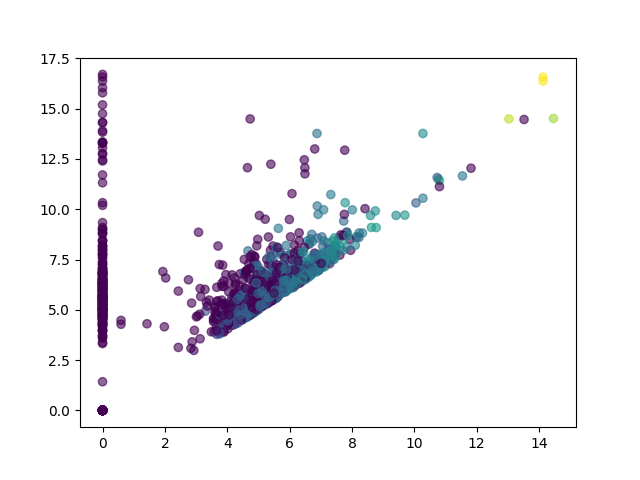

In [82]:
fig, ax = plt.subplots()
ax.scatter(junctions_middle_width,junctions_max_width,c= junctions_min_width,alpha = 0.6)

In [22]:
widths = [edge.width(t) for edge in edges]
lengths = [len(edge.pixel_list(t)) for edge in edges]

TypeError: 'NoneType' object is not subscriptable

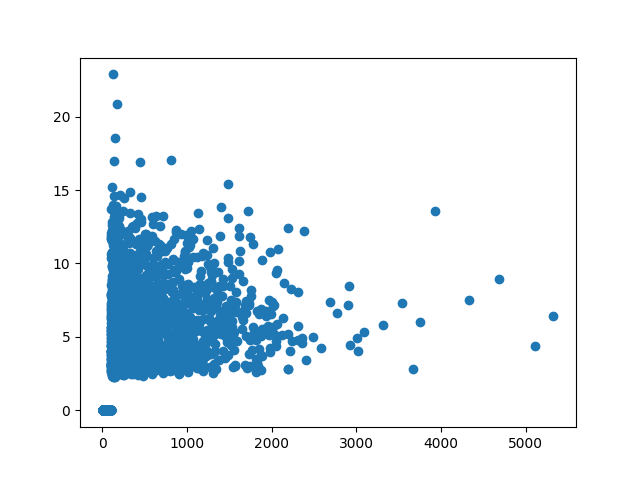

In [12]:
fig, ax = plt.subplots()
ax.scatter(lengths, widths)

(array([9.420e+02, 1.091e+03, 5.240e+02, 3.950e+02, 1.680e+02, 7.500e+01,
        1.200e+01, 3.000e+00, 1.000e+00, 2.000e+00]),
 array([ 0.        ,  2.28697567,  4.57395134,  6.86092701,  9.14790268,
        11.43487835, 13.72185402, 16.00882969, 18.29580536, 20.58278103,
        22.8697567 ]),
 <BarContainer object of 10 artists>)

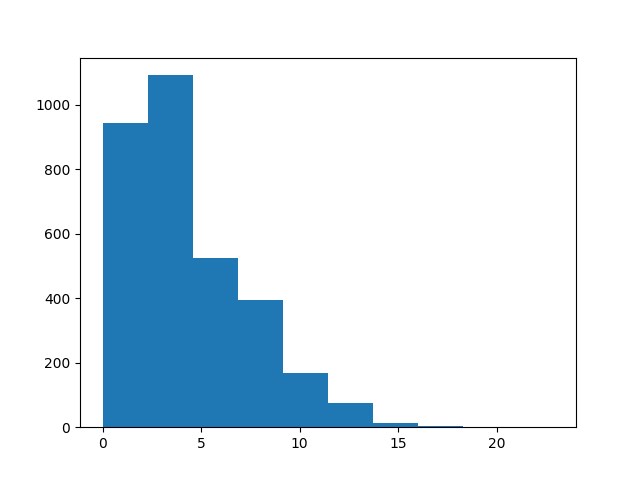

In [23]:
fig, ax = plt.subplots()
ax.hist(widths)

(array([9.420e+02, 1.091e+03, 5.240e+02, 3.950e+02, 1.680e+02, 7.500e+01,
        1.200e+01, 3.000e+00, 1.000e+00, 2.000e+00]),
 array([ 0.        ,  2.28697567,  4.57395134,  6.86092701,  9.14790268,
        11.43487835, 13.72185402, 16.00882969, 18.29580536, 20.58278103,
        22.8697567 ]),
 <BarContainer object of 10 artists>)

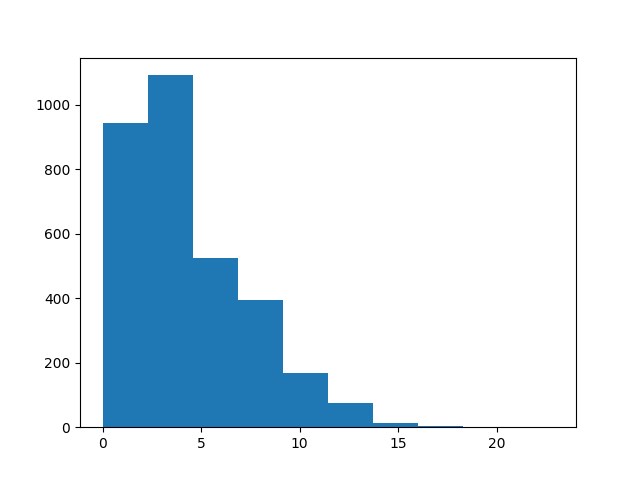

In [13]:
fig, ax = plt.subplots()
ax.hist(widths)

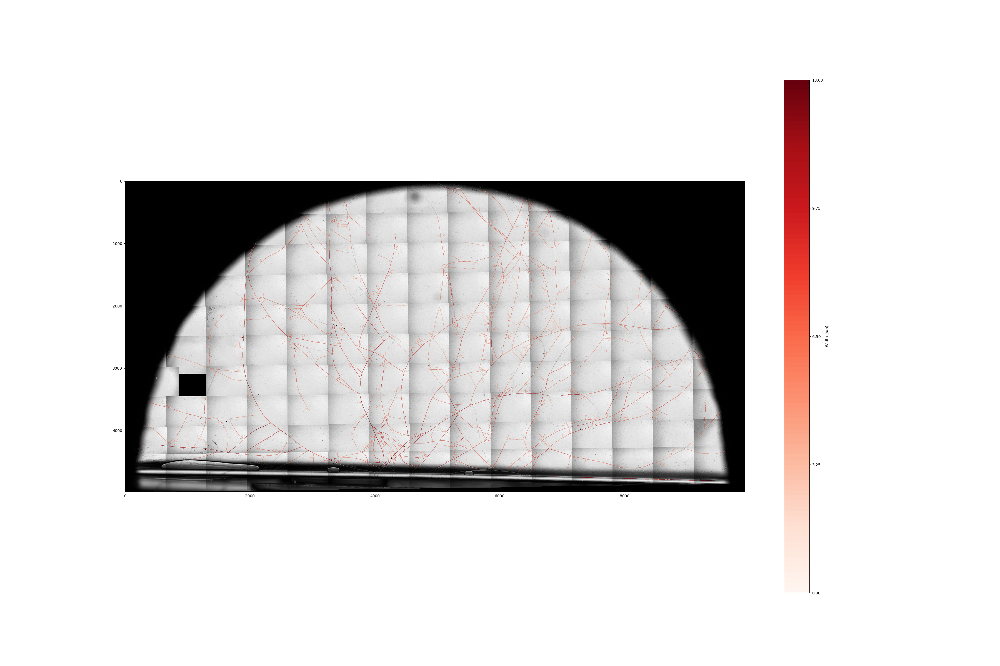

In [18]:
t = 1

plot_edge_width(
    exp, t, lambda edge: edge.width(t), dilation=5, plot_cmap=True, max_width=13
)

In [18]:
from amftrack.pipeline.functions.post_processing.exp_plot import *
from amftrack.pipeline.launching.run_super import run_parallel_post
directory = directory_targ
name_job = "width_plot"
time = "24:00:00"
list_f = [plot_width]

list_args = [[]] * len(list_f)
overwrite = True
num_parallel = 6
run_parallel_post(
    "exp_plot.py",
    list_f,
    list_args,
    [directory, overwrite],
    analysis_folders,
    num_parallel,
    time,
    "global_plate_post_process",
    cpus=128,
    name_job=name_job,
    node="fat",
)

Submitted batch job 2216645


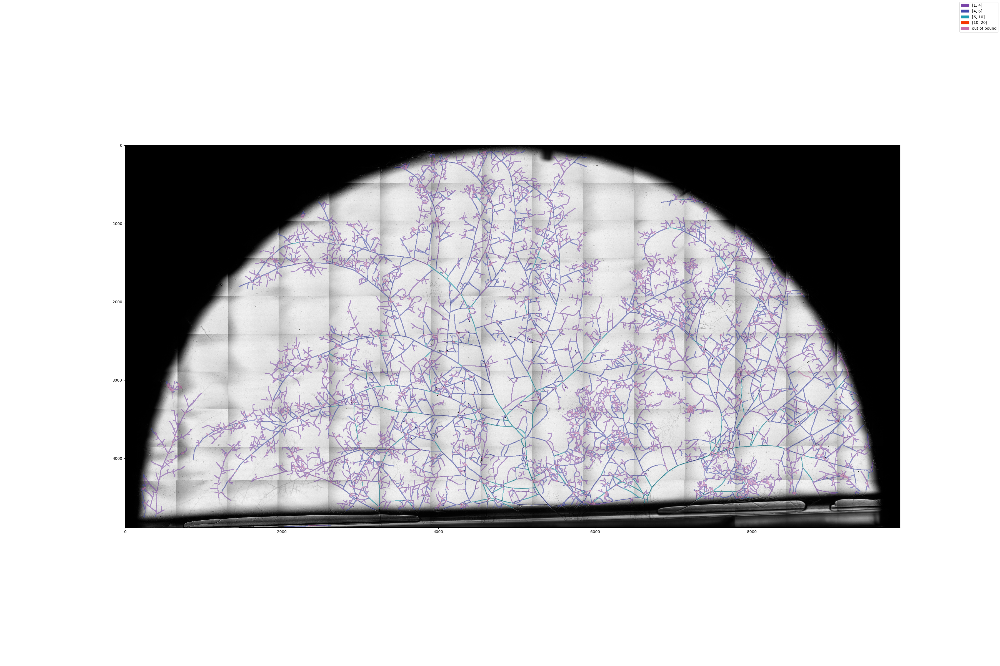

In [14]:
t = 1
plot_edge_width(exp, t, lambda edge: edge.width(t), dilation=10)

In [14]:
import networkx as nx

resolution = 50
skip = False
for t in range(exp.ts)[:2]:
    (G, pos) = exp.nx_graph[t], exp.positions[t]
    edge_test = get_width_info_new(exp, t, resolution=resolution, skip=skip)
    nx.set_edge_attributes(G, edge_test, "width")
    exp.nx_graph[t] = G

True
True


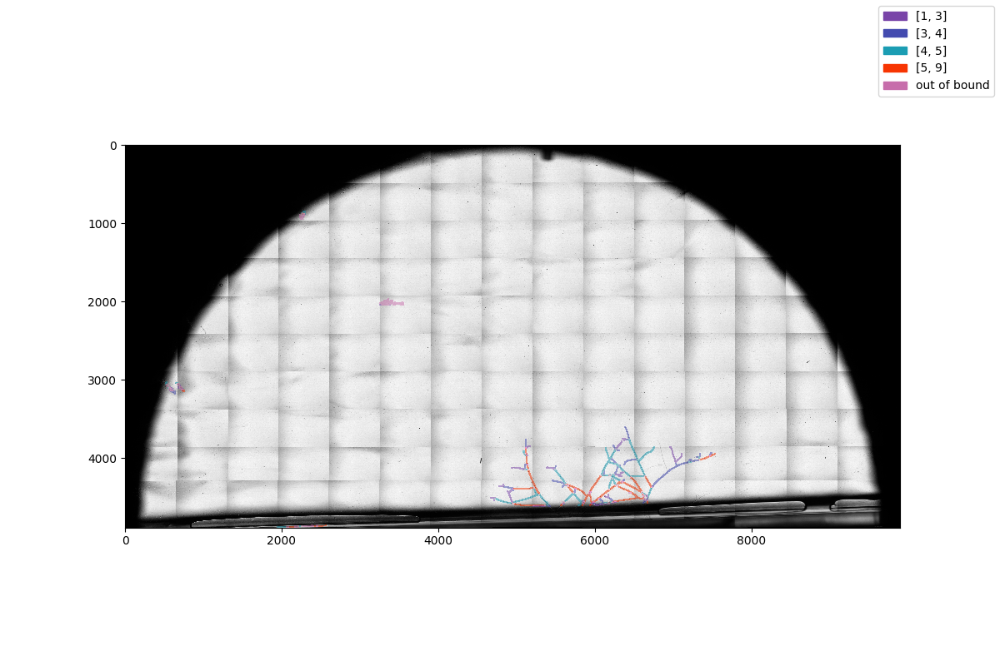

In [26]:
t = 0
intervals = [[1, 3], [3, 4], [4, 5], [5, 9]]

plot_edge_width(exp, t, lambda edge: edge.width(t), dilation=20, intervals=intervals)